In [128]:
import os
import numpy as np
import cv2 as cv
import pandas as pd
import matplotlib.pyplot as plt
from os import listdir
from os.path import isfile, join
from skimage.filters import threshold_otsu

In [129]:
#to create a list of contour areas and find the index of largest area
def contour_area(contours):
     
    # create an empty list
    cnt_area = np.zeros(len(contours))
    # loop through all the contours
    for i in range(0,len(contours)):
        # for each contour, use OpenCV to calculate the area of the contour
        cnt_area[i] = cv.contourArea(contours[i])
        
 
    #return index of largest area
    return np.argmax(cnt_area)

def draw_bounding_box(contours, image, number_of_boxes=1):
    # Call our function to get the index of largest contour area
    max_contours_index = contour_area(contours)
    
    x,y,w,h = cv.boundingRect(contours[max_contours_index])
             
    # Draw the bounding box
    image=cv.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
        
 
    return image, (x,y,x+w,y+h)

In [130]:
from shapely.geometry import Polygon

def bounding_accuracy(box1 , box2):
    box_shape_1 = [[box1[0], box1[1]], [box1[2], box1[1]],
               [box1[2], box1[3]], [box1[0], box1[3]]]
    
    box_shape_2 = [[box2[0], box2[1]], [box2[2], box2[1]],
               [box2[2], box2[3]], [box2[0], box2[3]]]
    # Draw polygon 1 from box 1
    polygon_1 = Polygon(box_shape_1)
 
    # Draw polygon 2 from box 2
    polygon_2 = Polygon(box_shape_2)
 
    # Calculate the intersection 
    intersect = polygon_1.intersection(polygon_2).area / polygon_1.union(polygon_2).area
 
    # intersection percentage
    return (round(intersect*100, 2))

In [142]:
%matplotlib inline
 
from matplotlib import pyplot as plt
 
def showimage(myimage):
    if (myimage.ndim>2):
        myimage = myimage[:,:,::-1] 
         
    fig, ax = plt.subplots(figsize=[5,5])
    ax.imshow(myimage, cmap = 'gray', interpolation = 'bicubic')
    plt.xticks([]), plt.yticks([])  
    plt.show()

In [132]:
def seg (img_path, train_ann):
    #load image
    box_loc = []
    img_name=[]
    total_accuracy=0
    success=0
    files = [ f for f in listdir(img_path) if isfile(join(img_path, f))]
    for eachFile in files:
        img_name.append(eachFile)
        img = cv.imread(join(img_path, eachFile), 1)
        
        img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        
        # Convert BGR to HSV
        img_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
        
        #Smooth image
        img_hsv = cv.GaussianBlur(img_hsv, (5,5), 0)


        #filter in red
        lower_red_1 = np.array([0, 75, 0])
        upper_red_1 = np.array([10, 255, 255])
        r_mask_1 = cv.inRange(img_hsv, lower_red_1, upper_red_1)
        lower_red_2 = np.array([150, 125, 50])
        upper_red_2 = np.array([180, 255, 255])
        r_mask_2 = cv.inRange(img_hsv, lower_red_2, upper_red_2)
        red_mask = cv.bitwise_or(r_mask_1, r_mask_2)

        #filter in blue
        lower_blue1 = np.array([95,150,0])
        upper_blue1 = np.array([120,255,255])
        b_mask_1 = cv.inRange(img_hsv, lower_blue1, upper_blue1)
        lower_blue2 = np.array([94, 127, 20])
        upper_blue2 = np.array([126, 255, 200])
        b_mask_2 = cv.inRange(img_hsv, lower_blue2, upper_blue2)
        blue_mask = cv.bitwise_or(b_mask_1, b_mask_2)

        #filter in yellow
        low_yellow = np.array([10,125,10])
        high_yellow = np.array([60,255,255])
        yellow_mask = cv.inRange(img_hsv, low_yellow, high_yellow)
        low_black = np.array([0, 0, 0]) 
        high_black = np.array([180, 50, 80])
        black_mask = cv.inRange(img_hsv, low_black, high_black)
        y_mask = cv.bitwise_or(yellow_mask, black_mask)
        
        mask = red_mask | blue_mask | y_mask 
        
        otsu_threshold, image_result = cv.threshold(mask, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
        
        #edges = cv.Canny(img_gray, 50, 200)
        
        # Generate contours
        contours,hierarchy = cv.findContours(image_result, 1, 2)
        
        img, loc = draw_bounding_box(contours, img)

        box_loc.append(loc)

        showimage(img)

        # calculate accuracy
        for j in range (len(train_ann)):
            if train_ann['File_Name'][j] == eachFile:
                print(train_ann['File_Name'][j],'==',eachFile)
                box2 = (train_ann['Start_X'][j],train_ann['Start_Y'][j],train_ann['End_X'][j],train_ann['End_Y'][j])
        
        accuracy = bounding_accuracy(loc, box2)
        print('accuracy is' , accuracy)
        if accuracy >= 80:
            success += 1
        
        total_accuracy += accuracy
        
    return img_name, box_loc, success, total_accuracy

In [133]:
from sklearn.preprocessing import LabelBinarizer

path= 'TsignRecgTrain4170Annotation.txt'

columns = ['File_Name', 'Width', 'Height', 'Start_X', 'Start_Y', 'End_X', 'End_Y', 'Category']

# Read and load the train annotation csv
train_ann = pd.read_csv(path, sep=";", index_col = False, names = columns)

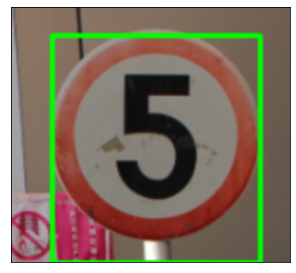

000_1_0002.png == 000_1_0002.png
accuracy is 85.17


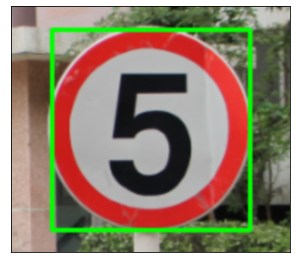

000_1_0012.png == 000_1_0012.png
accuracy is 92.89


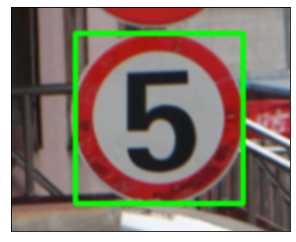

000_1_0013.png == 000_1_0013.png
accuracy is 90.35


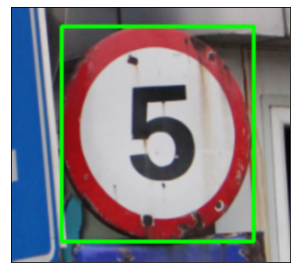

000_1_0018.png == 000_1_0018.png
accuracy is 97.53


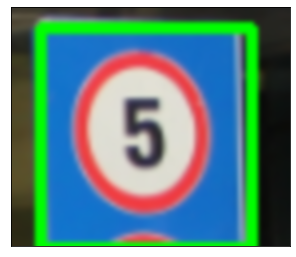

000_1_0034.png == 000_1_0034.png
accuracy is 53.45


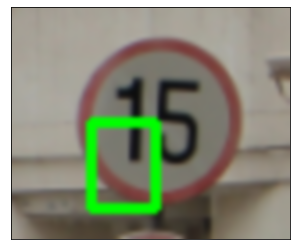

001_0004.png == 001_0004.png
accuracy is 18.76


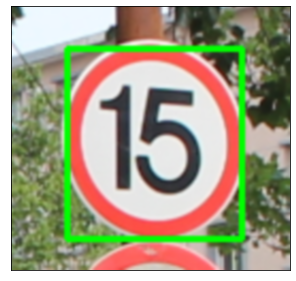

001_1_0009.png == 001_1_0009.png
accuracy is 87.3


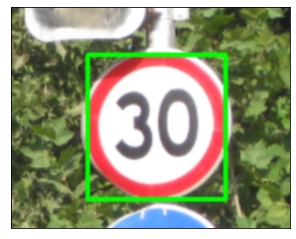

002_0020.png == 002_0020.png
accuracy is 87.97


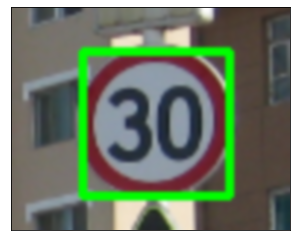

002_1_0010.png == 002_1_0010.png
accuracy is 81.02


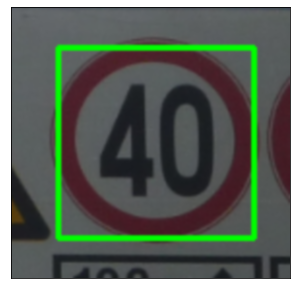

003_1_0034.png == 003_1_0034.png
accuracy is 84.89


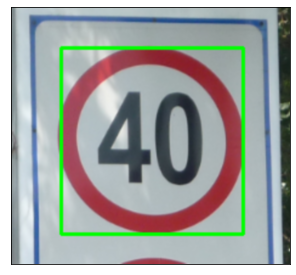

003_1_0071.png == 003_1_0071.png
accuracy is 96.77


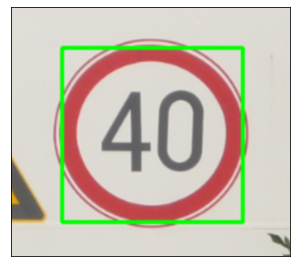

003_1_0106.png == 003_1_0106.png
accuracy is 85.35


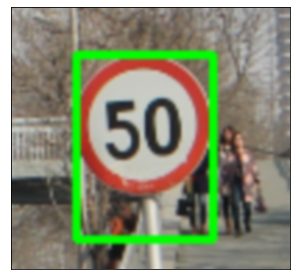

004_0030_j.png == 004_0030_j.png
accuracy is 71.21


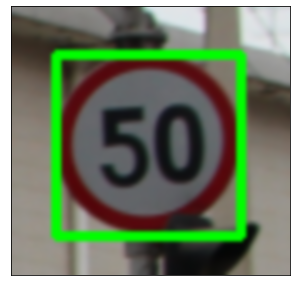

004_1_0020.png == 004_1_0020.png
accuracy is 96.43


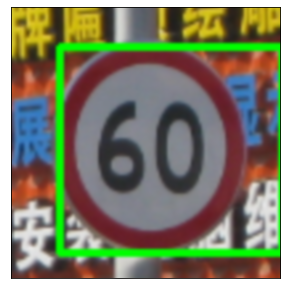

005_0030.png == 005_0030.png
accuracy is 80.97


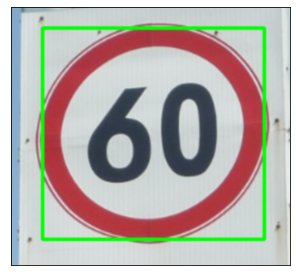

005_0079.png == 005_0079.png
accuracy is 90.33


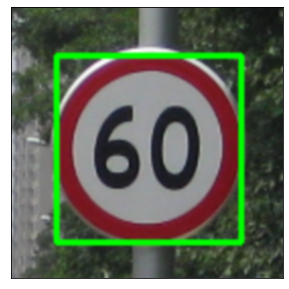

005_1_0022.png == 005_1_0022.png
accuracy is 89.02


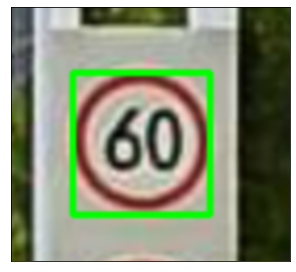

005_1_0026_1_j.png == 005_1_0026_1_j.png
accuracy is 93.82


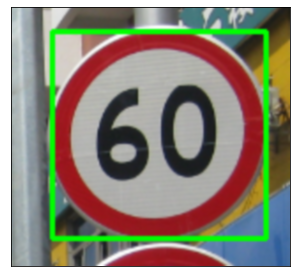

005_1_0027.png == 005_1_0027.png
accuracy is 95.12


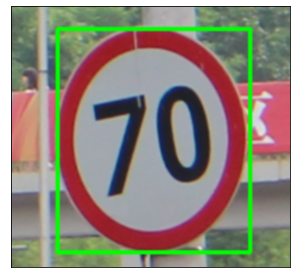

006_0023.png == 006_0023.png
accuracy is 96.07


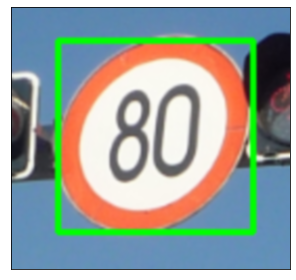

007_1_0006.png == 007_1_0006.png
accuracy is 95.78


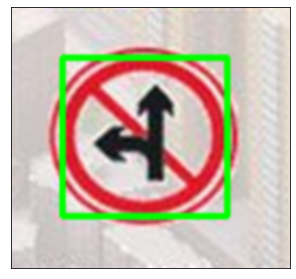

008_1_0008_1_j.png == 008_1_0008_1_j.png
accuracy is 98.67


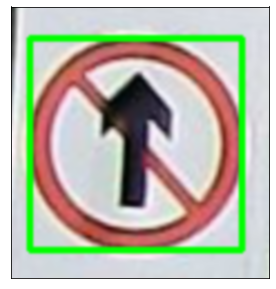

010_1_0013.png == 010_1_0013.png
accuracy is 97.94


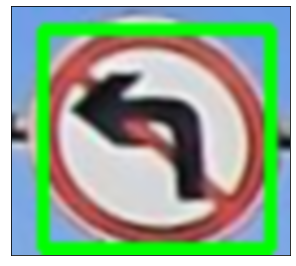

011_0029.png == 011_0029.png
accuracy is 91.01


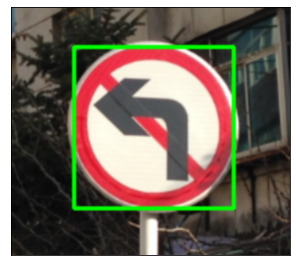

011_1_0019.png == 011_1_0019.png
accuracy is 95.01


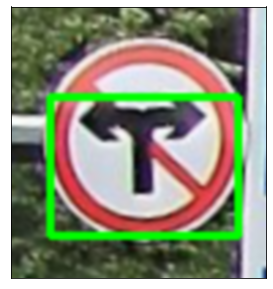

012_1_0015.png == 012_1_0015.png
accuracy is 70.1


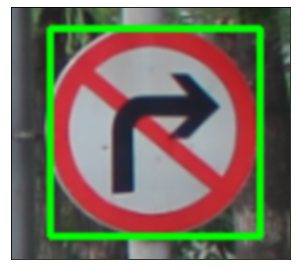

013_0013.png == 013_0013.png
accuracy is 96.65


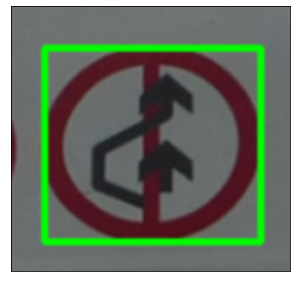

014_1_0028.png == 014_1_0028.png
accuracy is 89.41


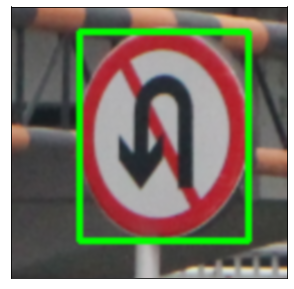

015_1_0001.png == 015_1_0001.png
accuracy is 95.13


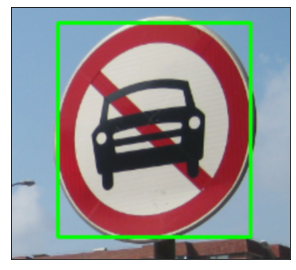

016_0018.png == 016_0018.png
accuracy is 94.76


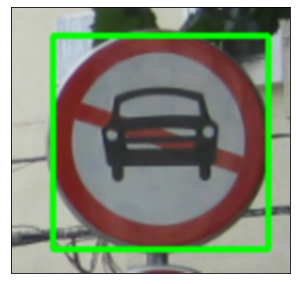

016_1_0014.png == 016_1_0014.png
accuracy is 91.91


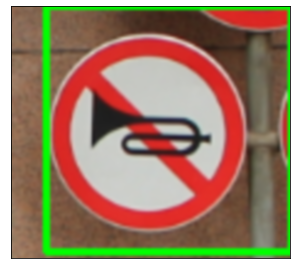

017_1_0017.png == 017_1_0017.png
accuracy is 62.41


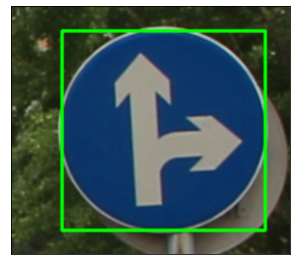

020_0006.png == 020_0006.png
accuracy is 90.49


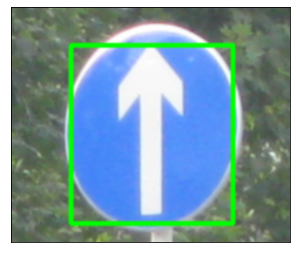

021_1_0002.png == 021_1_0002.png
accuracy is 79.12


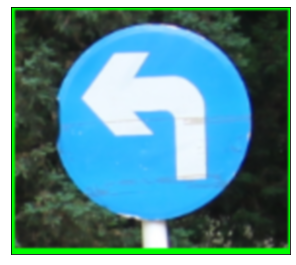

022_0005.png == 022_0005.png
accuracy is 57.06


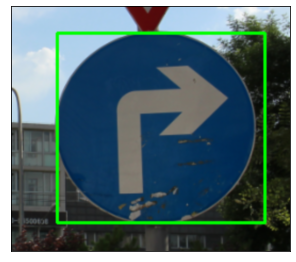

024_0017.png == 024_0017.png
accuracy is 92.45


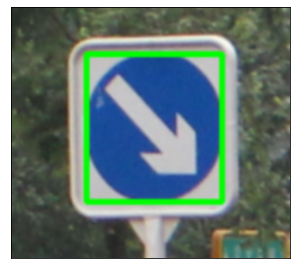

026_1_0016.png == 026_1_0016.png
accuracy is 92.26


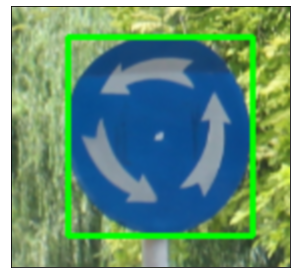

027_0002.png == 027_0002.png
accuracy is 95.93


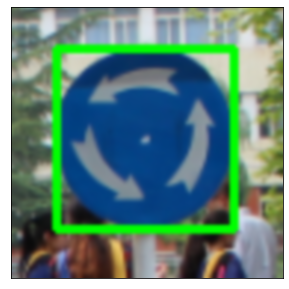

027_0010.png == 027_0010.png
accuracy is 98.36


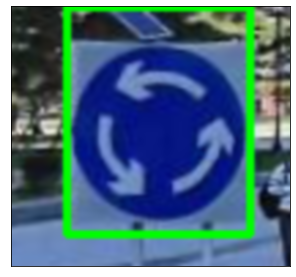

027_0012.png == 027_0012.png
accuracy is 76.24


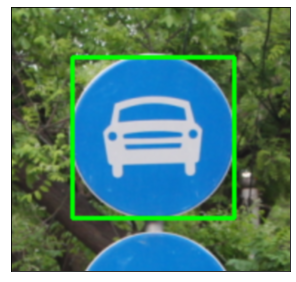

028_0114.png == 028_0114.png
accuracy is 90.59


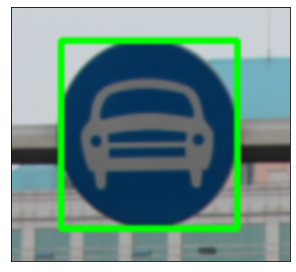

028_0202.png == 028_0202.png
accuracy is 94.05


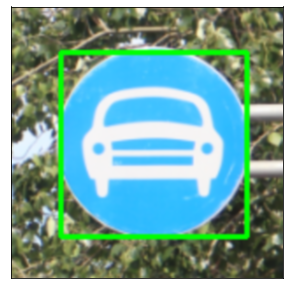

028_1_0007.png == 028_1_0007.png
accuracy is 93.68


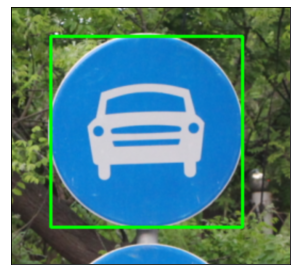

028_1_0209.png == 028_1_0209.png
accuracy is 96.21


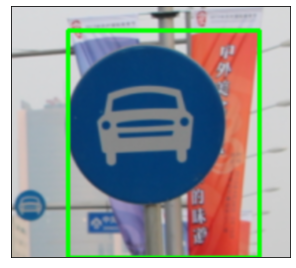

028_1_0216.png == 028_1_0216.png
accuracy is 57.07


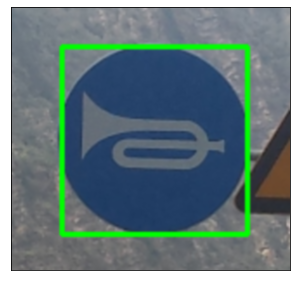

029_1_0015.png == 029_1_0015.png
accuracy is 93.79


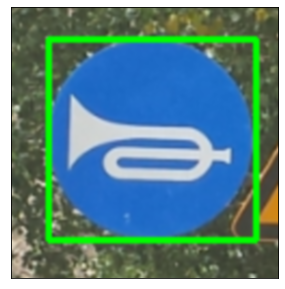

029_1_0017.png == 029_1_0017.png
accuracy is 97.89


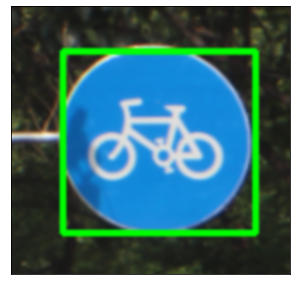

030_0004.png == 030_0004.png
accuracy is 94.32


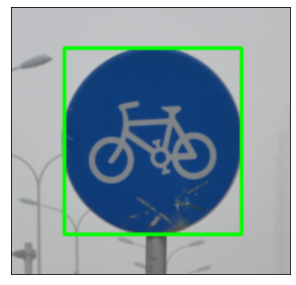

030_0018.png == 030_0018.png
accuracy is 97.94


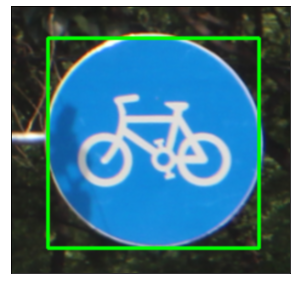

030_1_0002.png == 030_1_0002.png
accuracy is 96.09


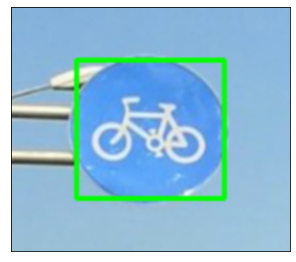

030_1_0018_1_j.png == 030_1_0018_1_j.png
accuracy is 92.37


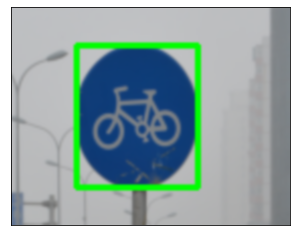

030_1_0023.png == 030_1_0023.png
accuracy is 96.97


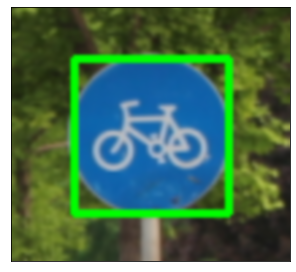

030_1_0027.png == 030_1_0027.png
accuracy is 88.77


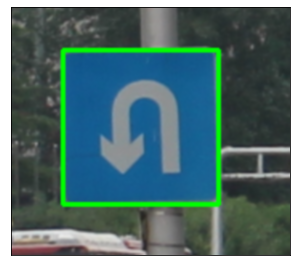

031_0003.png == 031_0003.png
accuracy is 95.02


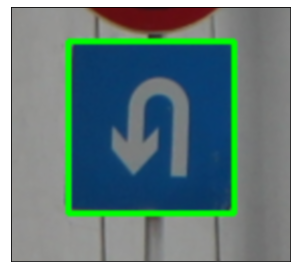

031_0011.png == 031_0011.png
accuracy is 95.35


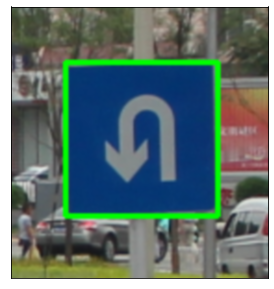

031_1_0012.png == 031_1_0012.png
accuracy is 95.32


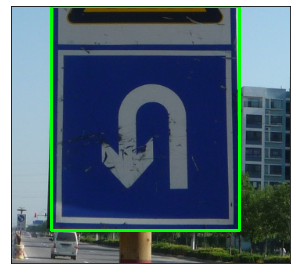

031_1_0020.png == 031_1_0020.png
accuracy is 74.39


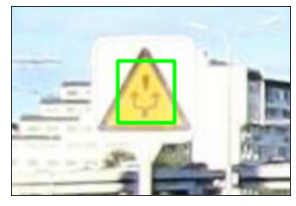

032_1_0001_1_j.png == 032_1_0001_1_j.png
accuracy is 41.49


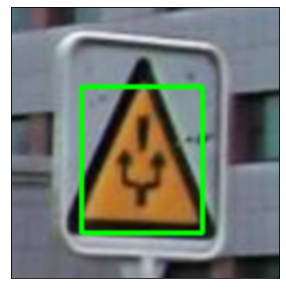

032_1_0002_1_j.png == 032_1_0002_1_j.png
accuracy is 67.14


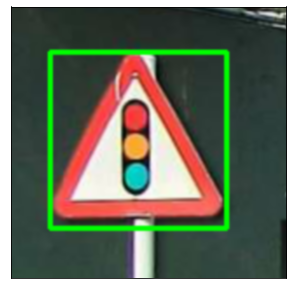

033_0002.png == 033_0002.png
accuracy is 91.17


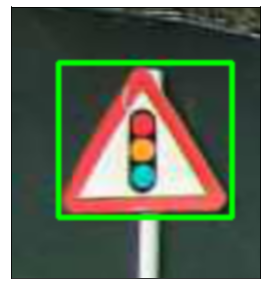

033_1_0001.png == 033_1_0001.png
accuracy is 87.78


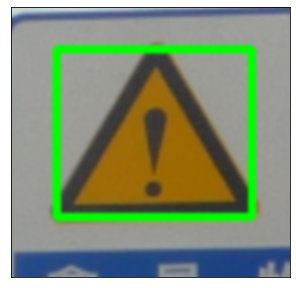

034_1_0002.png == 034_1_0002.png
accuracy is 91.32


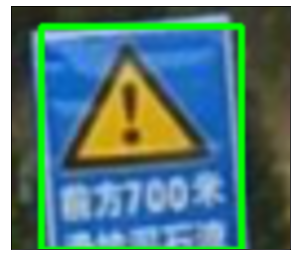

034_1_0003_1_j.png == 034_1_0003_1_j.png
accuracy is 42.05


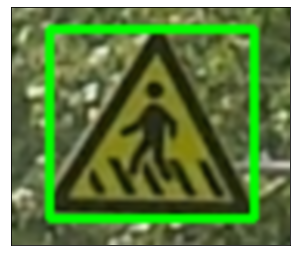

035_1_0002.png == 035_1_0002.png
accuracy is 96.92


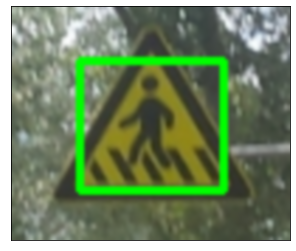

035_1_0003.png == 035_1_0003.png
accuracy is 51.72


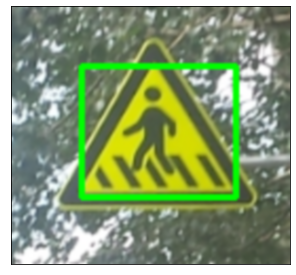

035_1_0004.png == 035_1_0004.png
accuracy is 59.44


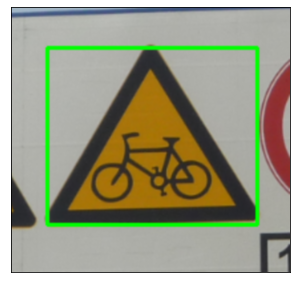

036_1_0014.png == 036_1_0014.png
accuracy is 96.09


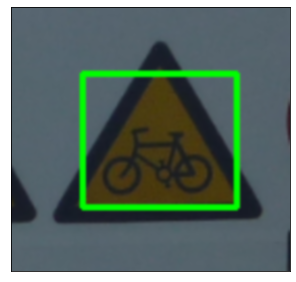

036_1_0016.png == 036_1_0016.png
accuracy is 53.29


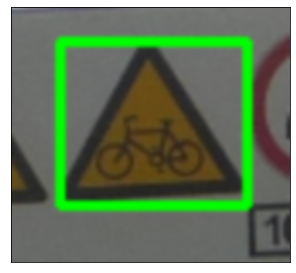

036_1_0019.png == 036_1_0019.png
accuracy is 95.92


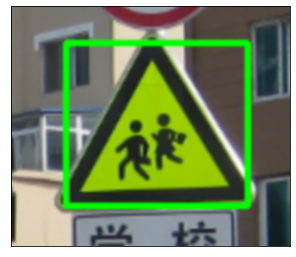

037_0019.png == 037_0019.png
accuracy is 84.54


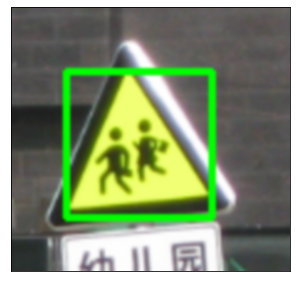

037_0021.png == 037_0021.png
accuracy is 63.58


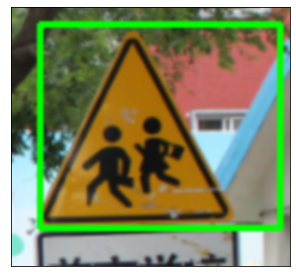

037_1_0009.png == 037_1_0009.png
accuracy is 72.54


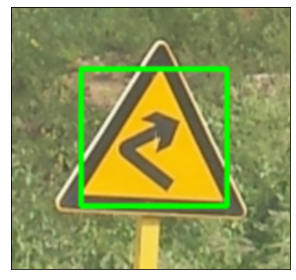

038_0008.png == 038_0008.png
accuracy is 60.05


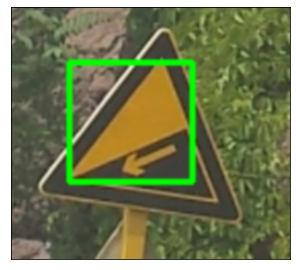

040_0011.png == 040_0011.png
accuracy is 35.89


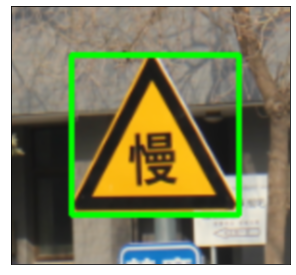

042_0002_j.png == 042_0002_j.png
accuracy is 89.71


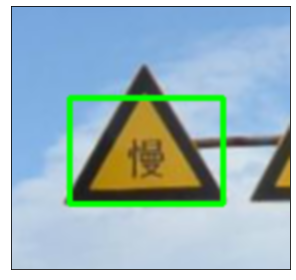

042_0016_j.png == 042_0016_j.png
accuracy is 75.19


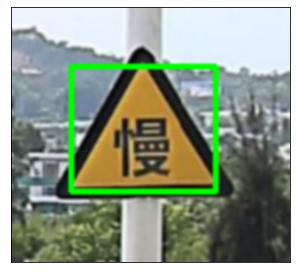

042_1_0004_1_j.png == 042_1_0004_1_j.png
accuracy is 67.87


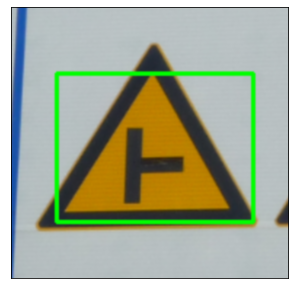

043_0024.png == 043_0024.png
accuracy is 72.77


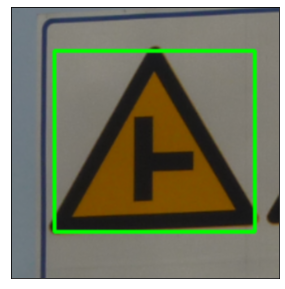

043_1_0021.png == 043_1_0021.png
accuracy is 94.15


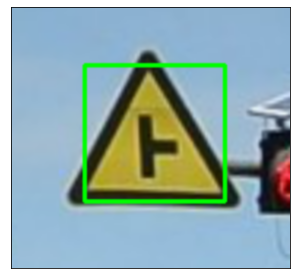

043_1_0035_1_j.png == 043_1_0035_1_j.png
accuracy is 72.61


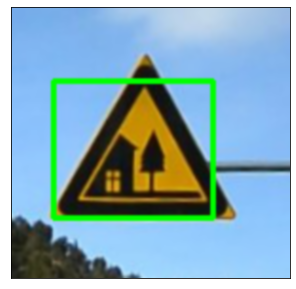

045_1_0004.png == 045_1_0004.png
accuracy is 79.42


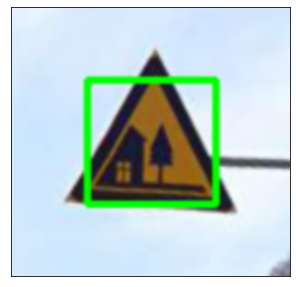

045_1_0007.png == 045_1_0007.png
accuracy is 63.1


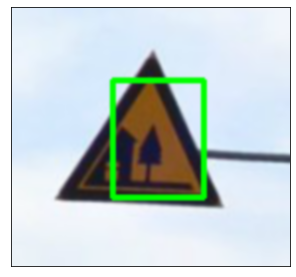

045_1_0009.png == 045_1_0009.png
accuracy is 44.64


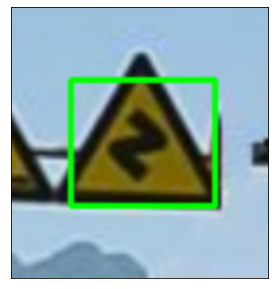

046_0005_j.png == 046_0005_j.png
accuracy is 73.29


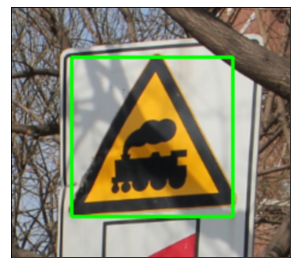

047_0005.png == 047_0005.png
accuracy is 94.24


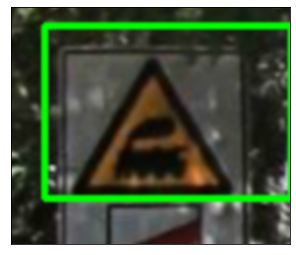

047_1_0003.png == 047_1_0003.png
accuracy is 50.71


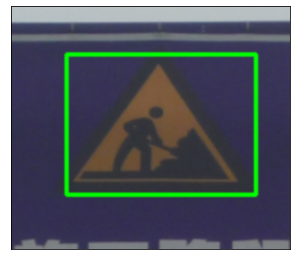

048_0004.png == 048_0004.png
accuracy is 89.67


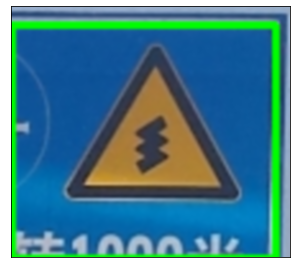

049_1_0010.png == 049_1_0010.png
accuracy is 44.32


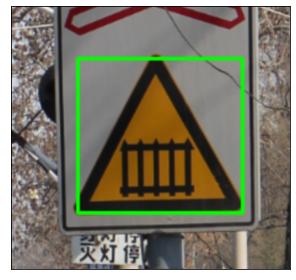

050_0014.png == 050_0014.png
accuracy is 93.41


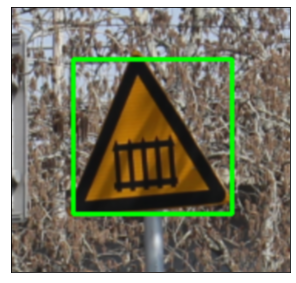

050_1_0003.png == 050_1_0003.png
accuracy is 91.64


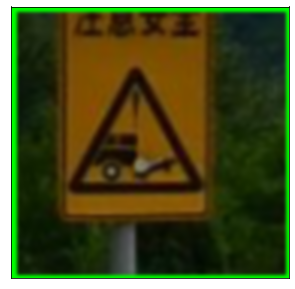

051_0005_j.png == 051_0005_j.png
accuracy is 23.91


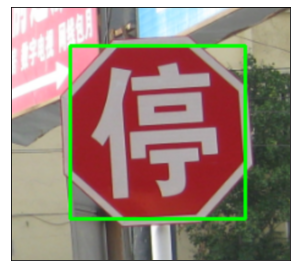

052_0001.png == 052_0001.png
accuracy is 82.86


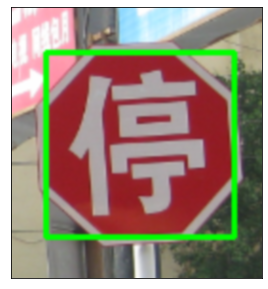

052_0002.png == 052_0002.png
accuracy is 83.88


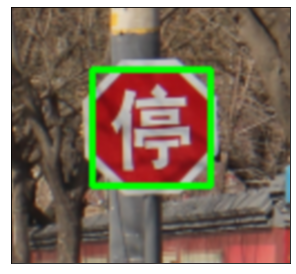

052_0013.png == 052_0013.png
accuracy is 75.3


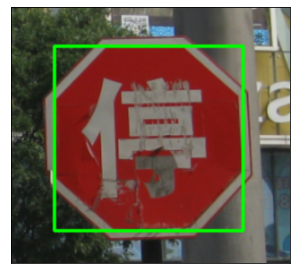

052_1_0005.png == 052_1_0005.png
accuracy is 83.58


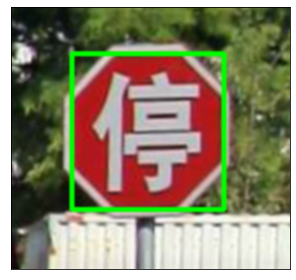

052_1_0008_1_j.png == 052_1_0008_1_j.png
accuracy is 84.64


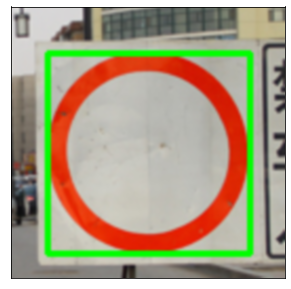

053_1_0001.png == 053_1_0001.png
accuracy is 96.92


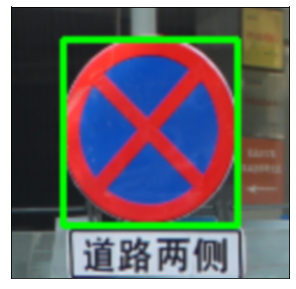

054_0009.png == 054_0009.png
accuracy is 93.87


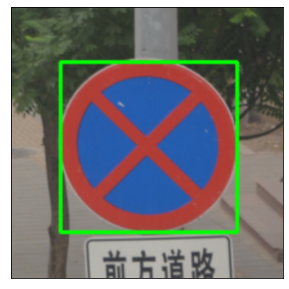

054_0151.png == 054_0151.png
accuracy is 97.09


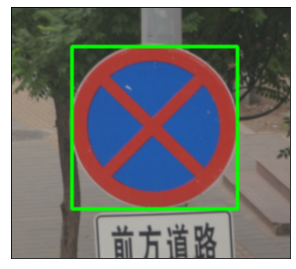

054_0153.png == 054_0153.png
accuracy is 97.09


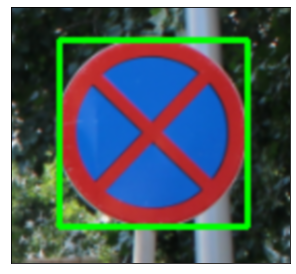

054_1_0007.png == 054_1_0007.png
accuracy is 96.76


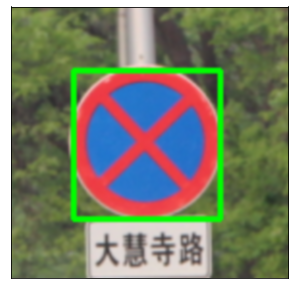

054_1_0121.png == 054_1_0121.png
accuracy is 91.42


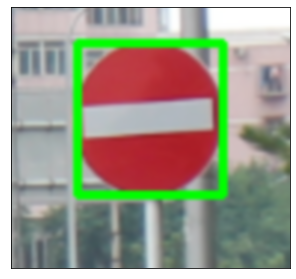

055_0034.png == 055_0034.png
accuracy is 92.45


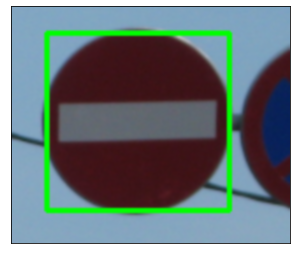

055_0047.png == 055_0047.png
accuracy is 90.12


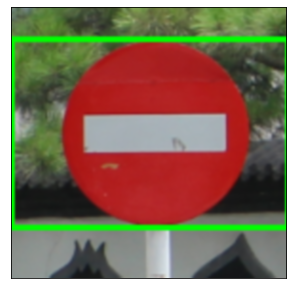

055_0053.png == 055_0053.png
accuracy is 67.35


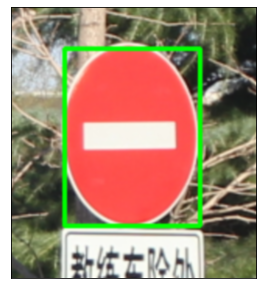

055_0076.png == 055_0076.png
accuracy is 94.96


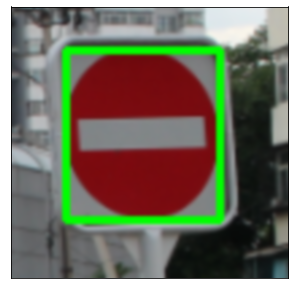

055_1_0002.png == 055_1_0002.png
accuracy is 95.1


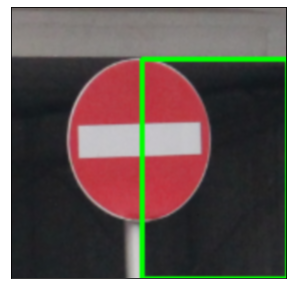

055_1_0031.png == 055_1_0031.png
accuracy is 26.37


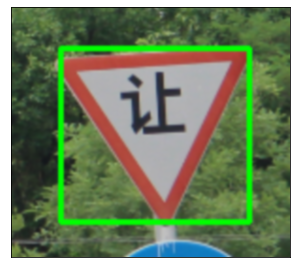

056_0044.png == 056_0044.png
accuracy is 95.02


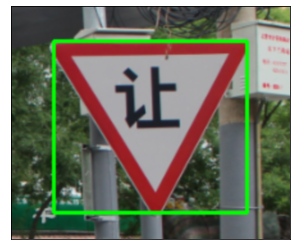

056_0052.png == 056_0052.png
accuracy is 97.96


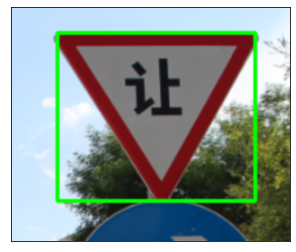

056_1_0010.png == 056_1_0010.png
accuracy is 97.07


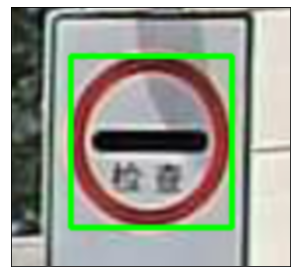

057_0003_j.png == 057_0003_j.png
accuracy is 97.56


In [143]:
img_name, box_loc, success, total_accuracy =seg('traffic_signs', train_ann)

In [135]:
print(success)

78


In [136]:
print("Segmentation accuracy:", round(total_accuracy/len(img_name),2),'%')
print("Total image:",len(img_name))

Segmentation accuracy: 82.45 %
Total image: 112
